In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
df_tr = pd.read_csv('sf-crime_train.csv')
df_tr.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [4]:
df_tr = df_tr.drop(['Descript', 'DayOfWeek', 'PdDistrict', 'Resolution', 'Address'], axis=1)
df_tr.tail()

,Dates,Category,X,Y
878044,2003-01-06 00:15:00,ROBBERY,-122.459033,37.714056
878045,2003-01-06 00:01:00,LARCENY/THEFT,-122.447364,37.731948
878046,2003-01-06 00:01:00,LARCENY/THEFT,-122.403390,37.780266
878047,2003-01-06 00:01:00,VANDALISM,-122.390531,37.780607
878048,2003-01-06 00:01:00,FORGERY/COUNTERFEITING,-122.394926,37.738212


In [7]:
df_tr.isnull().sum()

Dates       0
Category    0
X           0
Y           0
dtype: int64

In [9]:
df_tr.dtypes

Dates        object
Category     object
X           float64
Y           float64
dtype: object

In [10]:
df_tr.Dates.dtypes

dtype('O')

In [24]:
df_tr['Dates'] = df_tr['Dates'].map(str)
df_tr.Dates.dtype, df_tr.head()

(dtype('O'),
                  Dates        Category           X          Y
 0  2015-05-13 23:53:00        WARRANTS -122.425892  37.774599
 1  2015-05-13 23:53:00  OTHER OFFENSES -122.425892  37.774599
 2  2015-05-13 23:33:00  OTHER OFFENSES -122.424363  37.800414
 3  2015-05-13 23:30:00   LARCENY/THEFT -122.426995  37.800873
 4  2015-05-13 23:30:00   LARCENY/THEFT -122.438738  37.771541)

In [29]:
from datetime import datetime
df_tr['Dates'] = pd.to_datetime(df_tr['Dates'])
df_tr.Dates.dtype, df_tr.head()

(dtype('<M8[ns]'),
                 Dates        Category           X          Y
 0 2015-05-13 23:53:00        WARRANTS -122.425892  37.774599
 1 2015-05-13 23:53:00  OTHER OFFENSES -122.425892  37.774599
 2 2015-05-13 23:33:00  OTHER OFFENSES -122.424363  37.800414
 3 2015-05-13 23:30:00   LARCENY/THEFT -122.426995  37.800873
 4 2015-05-13 23:30:00   LARCENY/THEFT -122.438738  37.771541)

In [30]:
df_tr['year'] = df_tr['Dates'].dt.year
df_tr.head()

,Dates,Category,X,Y,year
0,2015-05-13 23:53:00,WARRANTS,-122.425892,37.774599,2015
1,2015-05-13 23:53:00,OTHER OFFENSES,-122.425892,37.774599,2015
2,2015-05-13 23:33:00,OTHER OFFENSES,-122.424363,37.800414,2015
3,2015-05-13 23:30:00,LARCENY/THEFT,-122.426995,37.800873,2015
4,2015-05-13 23:30:00,LARCENY/THEFT,-122.438738,37.771541,2015


In [32]:
df_tr['year'].unique()

array([2015, 2014, 2013, 2012, 2011, 2010, 2009, 2008, 2007, 2006, 2005,
       2004, 2003], dtype=int32)

In [34]:
df_2014 = df_tr[df_tr['year'] == 2014].copy()
df_2014.head()

,Dates,Category,X,Y,year
27584,2014-12-28 23:30:00,LARCENY/THEFT,-122.435563,37.760801,2014
27585,2014-12-28 23:30:00,LARCENY/THEFT,-122.433575,37.800037,2014
27586,2014-12-28 23:30:00,VEHICLE THEFT,-122.412777,37.786834,2014
27587,2014-12-28 23:30:00,ASSAULT,-122.421702,37.773641,2014
27588,2014-12-28 23:30:00,ASSAULT,-122.421702,37.773641,2014


In [35]:
from sklearn.preprocessing import MinMaxScaler

lat_scaler = MinMaxScaler()
lon_scaler = MinMaxScaler()

df_2014['X'] = lat_scaler.fit_transform(df_2014[['X']])
df_2014['Y'] = lon_scaler.fit_transform(df_2014[['Y']])

df_2014.head()

,Dates,Category,X,Y,year
27584,2014-12-28 23:30:00,LARCENY/THEFT,0.526134,0.471397,2014
27585,2014-12-28 23:30:00,LARCENY/THEFT,0.539528,0.821894,2014
27586,2014-12-28 23:30:00,VEHICLE THEFT,0.679676,0.703952,2014
27587,2014-12-28 23:30:00,ASSAULT,0.619540,0.586098,2014
27588,2014-12-28 23:30:00,ASSAULT,0.619540,0.586098,2014


In [44]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [45]:
k_range = range(1,30)
distance = []
for k in k_range:
    model = KMeans(n_clusters = k)
    model.fit(df_2014[['X', 'Y']])
    distance.append(model.inertia_)
distance

[5558.007674575365,
 3066.806184625173,
 1906.3400235089155,
 1505.1009477466782,
 1158.7878413743456,
 930.2099771929546,
 791.2815994751473,
 690.0079312137091,
 617.251629332014,
 548.9010000653296,
 524.27551921496,
 473.6394846921626,
 452.6918654712209,
 409.94683950196935,
 372.33297984745735,
 367.8265565227144,
 333.72656071536306,
 329.1606686090927,
 300.44410605216,
 287.09062906953386,
 267.89319463393696,
 254.59889976332713,
 241.90012216654853,
 240.3706036723814,
 226.24971553962754,
 209.02793242105884,
 201.91960389384477,
 194.4689922438529,
 185.02470460810636]

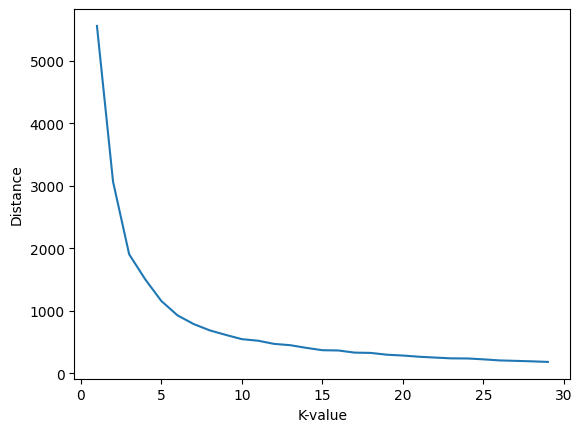

In [46]:
plt.plot(k_range,distance)
plt.xlabel('K-value')
plt.ylabel('Distance')
plt.show()

In [50]:
silhouette_scores = []

for n in range(2,30):
    kmeans = KMeans(n_clusters=n, random_state=42)
    cluster_labels = kmeans.fit_predict(df_2014[['X', 'Y']])
    
    silhouette_avg = silhouette_score(df_2014[['X', 'Y']], cluster_labels)
    silhouette_scores.append(silhouette_avg)

silhouette_scores

[np.float64(0.49257074852635885),
 np.float64(0.5080213133390572),
 np.float64(0.47973155815141744),
 np.float64(0.42724226541823945),
 np.float64(0.42955246044621287),
 np.float64(0.40368304999173965),
 np.float64(0.3887990149304045),
 np.float64(0.3904493421551726),
 np.float64(0.36248041046333457),
 np.float64(0.38212902591579856),
 np.float64(0.37413433936076756),
 np.float64(0.3772422729199434),
 np.float64(0.3757806631165629),
 np.float64(0.3716891271636616),
 np.float64(0.3805783880351705),
 np.float64(0.37546339625387787),
 np.float64(0.3726474623571064),
 np.float64(0.38042145257886495),
 np.float64(0.3833121264634311),
 np.float64(0.3660554051087134),
 np.float64(0.36968352839769886),
 np.float64(0.37052955705437707),
 np.float64(0.376636712563454),
 np.float64(0.3731364353198695),
 np.float64(0.37247211726244556),
 np.float64(0.37056519371050034),
 np.float64(0.3730657299424914),
 np.float64(0.37469869748533596)]

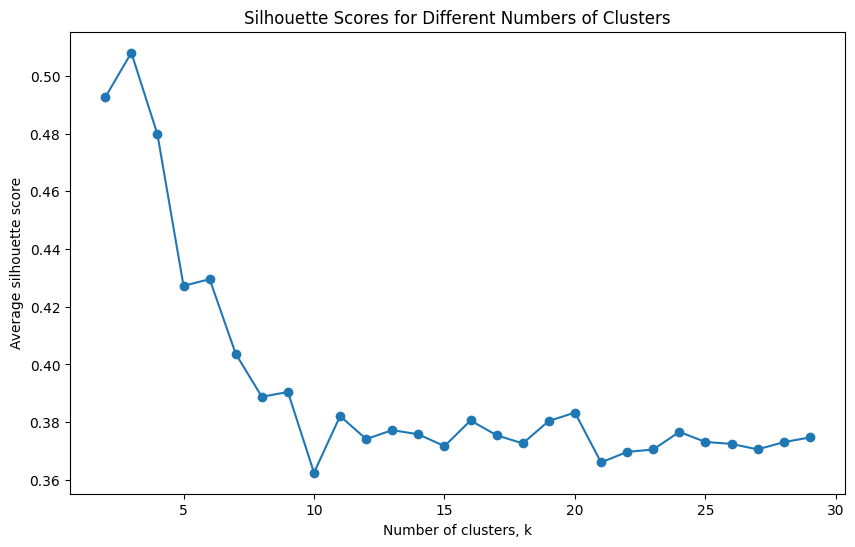

In [51]:
plt.figure(figsize=(10, 6))
plt.plot(range(2,30), silhouette_scores, marker='o')
plt.title("Silhouette Scores for Different Numbers of Clusters")
plt.xlabel("Number of clusters, k")
plt.ylabel("Average silhouette score")
plt.show()

In [68]:
model = KMeans(n_clusters=5)
y_pred = model.fit_predict(df_2014[['X', 'Y']])
y_pred

array([1, 2, 2, ..., 2, 4, 2], dtype=int32)

In [69]:
df_2014['cluster'] = y_pred
df_2014.head()

,Dates,Category,X,Y,year,cluster,lat,lon
27584,2014-12-28 23:30:00,LARCENY/THEFT,0.526134,0.471397,2014,1,37.760801,-122.435563
27585,2014-12-28 23:30:00,LARCENY/THEFT,0.539528,0.821894,2014,2,37.800037,-122.433575
27586,2014-12-28 23:30:00,VEHICLE THEFT,0.679676,0.703952,2014,2,37.786834,-122.412777
27587,2014-12-28 23:30:00,ASSAULT,0.619540,0.586098,2014,1,37.773641,-122.421702
27588,2014-12-28 23:30:00,ASSAULT,0.619540,0.586098,2014,1,37.773641,-122.421702


In [70]:
df_2014['lat'] = df_tr.loc[df_tr['year'] == 2014, 'Y']
df_2014.head()

,Dates,Category,X,Y,year,cluster,lat,lon
27584,2014-12-28 23:30:00,LARCENY/THEFT,0.526134,0.471397,2014,1,37.760801,-122.435563
27585,2014-12-28 23:30:00,LARCENY/THEFT,0.539528,0.821894,2014,2,37.800037,-122.433575
27586,2014-12-28 23:30:00,VEHICLE THEFT,0.679676,0.703952,2014,2,37.786834,-122.412777
27587,2014-12-28 23:30:00,ASSAULT,0.619540,0.586098,2014,1,37.773641,-122.421702
27588,2014-12-28 23:30:00,ASSAULT,0.619540,0.586098,2014,1,37.773641,-122.421702


In [71]:
df_2014['lon'] = df_tr.loc[df_tr['year'] == 2014, 'X']
df_2014.head()

,Dates,Category,X,Y,year,cluster,lat,lon
27584,2014-12-28 23:30:00,LARCENY/THEFT,0.526134,0.471397,2014,1,37.760801,-122.435563
27585,2014-12-28 23:30:00,LARCENY/THEFT,0.539528,0.821894,2014,2,37.800037,-122.433575
27586,2014-12-28 23:30:00,VEHICLE THEFT,0.679676,0.703952,2014,2,37.786834,-122.412777
27587,2014-12-28 23:30:00,ASSAULT,0.619540,0.586098,2014,1,37.773641,-122.421702
27588,2014-12-28 23:30:00,ASSAULT,0.619540,0.586098,2014,1,37.773641,-122.421702


In [72]:
import plotly.express as px

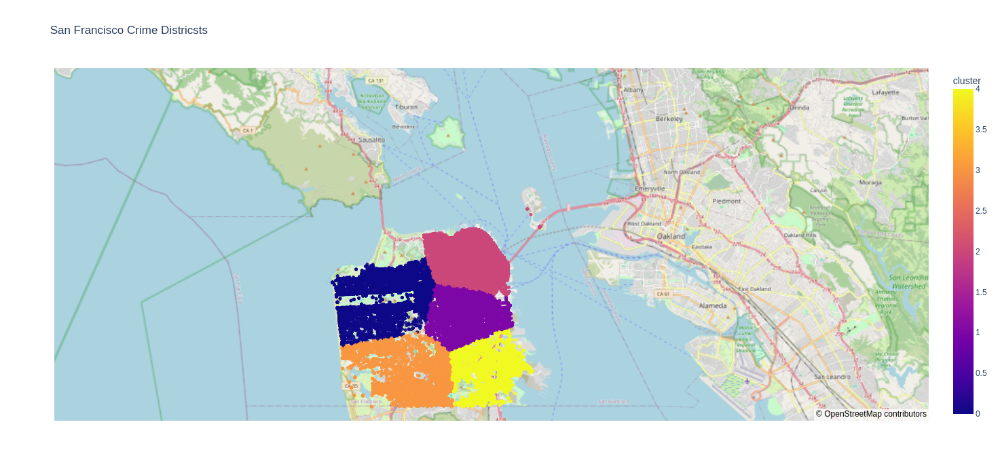

In [76]:
figure = px.scatter_mapbox(df_2014, lat = 'lat', lon = 'lon', center = dict(lat = 37.8, lon = -122.4), zoom = 10.5, opacity = .9, mapbox_style = 'open-street-map',
                           color = 'cluster', title = 'San Francisco Crime Districsts', width = 1100, height = 700, hover_data = ['cluster', 'Category'])
figure.show()

In [77]:
import plotly
plotly.offline.plot(figure, filename = 'sf_crime_cluster_map.html', auto_open = True)

'sf_crime_cluster_map.html'